In [1]:
pip install scikit-image pandas deepinv scikit-learn timm torchmetrics

  Using cached pandas-2.2.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (19 kB)
  Using cached deepinv-0.2.0-py3-none-any.whl.metadata (7.2 kB)
  Using cached scikit_learn-1.5.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (12 kB)
  Using cached timm-1.0.9-py3-none-any.whl.metadata (42 kB)
  Using cached torchmetrics-1.4.1-py3-none-any.whl.metadata (20 kB)
  Using cached tzdata-2024.1-py2.py3-none-any.whl.metadata (1.4 kB)
  Using cached hdf5storage-0.1.19-py2.py3-none-any.whl.metadata (24 kB)
  Using cached einops-0.8.0-py3-none-any.whl.metadata (12 kB)
  Using cached wandb-0.17.8-py3-none-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (9.6 kB)
  Using cached threadpoolctl-3.5.0-py3-none-any.whl.metadata (13 kB)
  Using cached huggingface_hub-0.24.6-py3-none-any.whl.metadata (13 kB)
  Using cached safetensors-0.4.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.8 kB)
  Using cached lightning_utilities-0.11

In [2]:
import os
from pathlib import Path

import deepinv as dinv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt  # Added plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
from PIL import Image
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm
from torch.utils.data import DataLoader, Dataset, TensorDataset
from torchmetrics import StructuralSimilarityIndexMeasure

from deepinv.models import TVDenoiser
from deepinv.optim.data_fidelity import L2
from deepinv.optim.optimizers import optim_builder
from deepinv.optim.prior import PnP
from deepinv.training import test
from deepinv.utils.demo import load_dataset, load_degradation, load_url_image
from deepinv.utils.parameters import get_GSPnP_params
from deepinv.utils.plotting import plot
import warnings


/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
df = pd.read_csv('metadata_splits.csv')
df = df.drop(['split_closed', 'split_open'],  axis=1)

In [4]:
train_df = df[df['split_closed_random'] == 'train']
test_df = df[df['split_closed_random'] == 'test']

In [5]:
train_df

,id,width,height,file_name,timestamp,identity,date,year,split_closed_random
1,2,2000,1333,images/t001/EKyrFKHQzh.JPG,2014-07-14 14:48:49,t001,2014-07-14,2014,train
2,3,2000,1333,images/t001/ELAvEqeXxT.JPG,2014-07-14 14:49:48,t001,2014-07-14,2014,train
6,7,2000,1333,images/t001/OiaMESWPyh.JPG,2014-07-14 14:52:17,t001,2014-07-14,2014,train
9,10,2000,1124,images/t001/ZKnMahXQgJ.JPG,2010-07-02 14:08:14,t001,2010-07-02,2010,train
11,12,2000,1124,images/t001/anuJvqUqBB.JPG,2010-07-02 14:10:48,t001,2010-07-02,2010,train
...,...,...,...,...,...,...,...,...,...
8719,8720,2000,1333,images/t610/ZfLKhiurRU.jpeg,2022-07-02 19:53:32,t610,2022-07-02,2022,train
8723,8724,2000,1333,images/t610/jmGmFqXpyJ.jpeg,2022-07-08 19:35:07,t610,2022-07-08,2022,train
8725,8726,2000,1333,images/t610/aOzTdMCkzF.jpeg,2022-07-08 19:35:08,t610,2022-07-08,2022,train
8726,8727,2000,1333,images/t610/ZmTLXySHIZ.jpeg,2022-07-08 19:35:15,t610,2022-07-08,2022,train


In [6]:
sampled_df = test_df.sample(n=100, random_state=42)
sample_img = test_df[test_df['file_name'] == 'images/t441/twkHlyAaYh.JPG']

In [7]:
sampled_df

,id,width,height,file_name,timestamp,identity,date,year,split_closed_random
732,733,2000,1333,images/t033/zjeLdAyepv.JPG,2020-06-21 07:08:31,t033,2020-06-21,2020,test
1136,1137,2000,1500,images/t056/TtLqCOOUhn.JPG,2013-07-21 17:20:39,t056,2013-07-21,2013,test
2392,2393,2000,1333,images/t141/nFyCadXWCH.JPG,2020-07-12 18:25:19,t141,2020-07-12,2020,test
5092,5093,2000,1333,images/t263/EHasQiDlGR.JPG,2020-06-30 18:58:18,t263,2020-06-30,2020,test
4237,4238,2000,1333,images/t236/GAYJBHXtYe.JPG,2018-08-22 18:01:07,t236,2018-08-22,2018,test
...,...,...,...,...,...,...,...,...,...
1733,1734,2000,1333,images/t092/oRbVLKDrCI.jpg,2019-06-20 18:32:49,t092,2019-06-20,2019,test
4072,4073,2000,1333,images/t232/oAoiWSEnoN.jpg,2019-06-18 17:22:54,t232,2019-06-18,2019,test
7136,7137,2000,1192,images/t402/XCJfQhSFfJ.jpg,2019-06-19 17:46:24,t402,2019-06-19,2019,test
1351,1352,2000,1500,images/t067/mmWGLwhNhx.JPG,2013-07-21 16:48:00,t067,2013-07-21,2013,test


# Different noise levels on a sample image

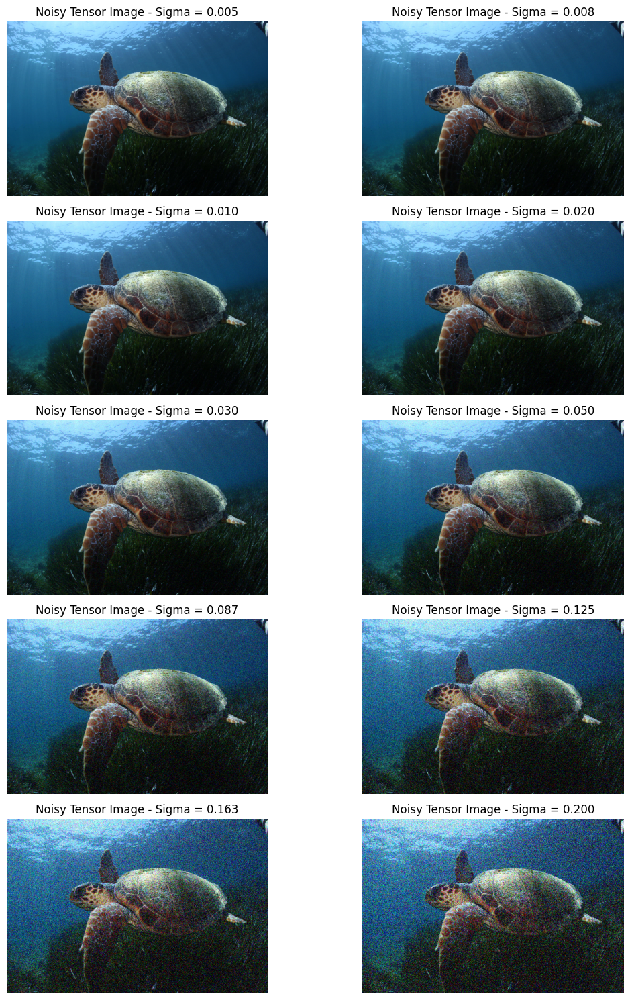

In [8]:
transform = transforms.ToTensor()
img_size = (3, 1440, 1920)
factor = 3
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

sigma_values = [0.005, 0.008, 0.01, 0.02, 0.03, 0.05, 0.0875, 0.125, 0.1625, 0.2]


fig, axs = plt.subplots(5, 2, figsize=(12, 15))

for i, sigma in enumerate(sigma_values):
    
    downsampling_module_with_noise = dinv.physics.Downsampling(
        img_size=img_size,
        factor=factor,
        device=device,
        noise_model=dinv.physics.GaussianNoise(sigma=sigma)
    )
    
    downsampling_module_without_noise = dinv.physics.Downsampling(
        img_size=img_size,
        factor=factor,
        device=device,
        noise_model=dinv.physics.GaussianNoise(sigma=0)
    )

    def image_prep_denoising(image):
        # Use the transform defined outside this function
        prep_image = transform(image).to(device)
        true_image_downsampled_without_noise = downsampling_module_without_noise(prep_image.unsqueeze(0)).to(device)
        true_image_downsampled_with_noise = downsampling_module_with_noise(prep_image.unsqueeze(0)).to(device)
        return true_image_downsampled_without_noise, true_image_downsampled_with_noise

    first_image = sample_img.iloc[0] 
    file_name = first_image['file_name']
    image_path = os.path.join(file_name)
    
    with Image.open(image_path) as image: 
        true_image_downsampled_without_noise, true_image_downsampled_with_noise = image_prep_denoising(image)

    noisy_image_tensor = true_image_downsampled_with_noise.squeeze(0)
    if noisy_image_tensor.dim() == 4:
        noisy_image_tensor = noisy_image_tensor.squeeze(0)
    
    noisy_image_tensor = noisy_image_tensor.clip(0, 1).cpu().numpy().transpose(1, 2, 0)

    row_idx = i // 2  
    col_idx = i % 2 

    axs[row_idx, col_idx].imshow(noisy_image_tensor)
    axs[row_idx, col_idx].set_title(f"Noisy Tensor Image - Sigma = {sigma:.3f}")
    axs[row_idx, col_idx].axis('off')

    del true_image_downsampled_without_noise, true_image_downsampled_with_noise, noisy_image_tensor
    torch.cuda.empty_cache()  

plt.tight_layout()
plt.show()


# Custom Denoiser 

In [9]:
class CustomDenoiser(nn.Module):
    def __init__(self):
        super(CustomDenoiser, self).__init__()
        
        # Encoder
        self.c1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.c2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.p1 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        
        self.c3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.c4 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.p2 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        
        self.c5 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.c6 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.c7 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.p3 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        
        self.c8 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.c9 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.c10 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        
        # Decoder
        self.u1 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.c11 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.c12 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.c13 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        
        self.u2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.c14 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.c15 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        
        self.u3 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.c16 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.c17 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        
        self.output_layer = nn.Conv2d(64, 3, kernel_size=1)

    def forward(self, x, noise_level=None):
        # Encoder
        c1 = F.relu(self.c1(x))
        c1 = F.relu(self.c2(c1))
        p1 = self.p1(c1)
        
        c2 = F.relu(self.c3(p1))
        c2 = F.relu(self.c4(c2))
        p2 = self.p2(c2)
        
        c3 = F.relu(self.c5(p2))
        c3 = F.relu(self.c6(c3))
        c3 = F.relu(self.c7(c3))
        p3 = self.p3(c3)
        
        c4 = F.relu(self.c8(p3))
        c4 = F.relu(self.c9(c4))
        c4 = F.relu(self.c10(c4))
        
        # Decoder
        u1 = self.u1(c4)
        u1 = torch.cat((u1, c3), dim=1)
        c5 = F.relu(self.c11(u1))
        c5 = F.relu(self.c12(c5))
        c5 = F.relu(self.c13(c5))
        
        u2 = self.u2(c5)
        u2 = torch.cat((u2, c2), dim=1)
        c6 = F.relu(self.c14(u2))
        c6 = F.relu(self.c15(c6))
        
        u3 = self.u3(c6)
        u3 = torch.cat((u3, c1), dim=1)
        c7 = F.relu(self.c16(u3))
        c7 = F.relu(self.c17(c7))
        
        outputs = self.output_layer(c7)
        
        return torch.sigmoid(outputs)



# Loading and processing data for custom denoiser

In [10]:
def image_prep_denoising(image, noise_level):
    downsampling_module_with_noise = dinv.physics.Downsampling(
        img_size=img_size, factor=factor, device=device,
        noise_model=dinv.physics.GaussianNoise(sigma=noise_level)
    )
    downsampling_module_without_noise = dinv.physics.Downsampling(
        img_size=img_size, factor=factor, device=device,
        noise_model=dinv.physics.GaussianNoise(sigma=0)
    )
    prep_image = transform(image).to(device)
    true_image_downsampled_without_noise = downsampling_module_without_noise(prep_image.unsqueeze(0)).to(device)
    true_image_downsampled_with_noise = downsampling_module_with_noise(prep_image.unsqueeze(0)).to(device)
    return true_image_downsampled_without_noise, true_image_downsampled_with_noise

In [11]:
# Framework function
def framework(images, metadata, dataprep, model, denoiser_name, idx=None, results=None):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    model = model.to(device)
    if results is None:
        results = []
    for i, image in enumerate(images):
        output, input = dataprep(image)
        input = input.to(device) 
        pred = model(input).to(device)

        # PSNR
        psnr_metric = dinv.loss.PSNR(max_pixel=1.0, normalize=False)
        psnr_value = psnr_metric.forward(pred, output)

        # MSE
        mse_value = F.mse_loss(pred, output).item()

        if idx is None:
            df_idx = i
        else:
            df_idx = idx - batch_size + i + 1
            
        identity = metadata.iloc[df_idx]['identity']
        file_name = metadata.iloc[df_idx]['file_name']
        results.append({
            'identity': identity,
            'file_name': file_name,
            'denoiser': denoiser_name,
            'psnr_value': psnr_value.item(),
            'mse_value': mse_value
        })
        
        print(f'Image {df_idx}: Identity = {identity}, File Name = {file_name}, PSNR = {psnr_value.item()}, MSE = {mse_value}', {denoiser_name})
    return results



In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
transform = transforms.ToTensor()
batch_size = 1
noise_levels = [0.05, 0.0875, 0.125, 0.1625, 0.2]

denoisers = {
    0.05: (CustomDenoiser().to(device), 'custom_denoiser_0.05'),
    0.0875: (CustomDenoiser().to(device), 'custom_denoiser_0.0875'),
    0.125: (CustomDenoiser().to(device), 'custom_denoiser_0.125'),
    0.1625: (CustomDenoiser().to(device), 'custom_denoiser_0.1625'),
    0.2: (CustomDenoiser().to(device), 'custom_denoiser_0.2')
}

denoisers_natural_imgs = {
    0.05: (CustomDenoiser().to(device), 'denoiser_natural_0.05'),
    0.0875: (CustomDenoiser().to(device), 'denoiser_natural_0.0875'),
    0.125: (CustomDenoiser().to(device), 'denoiser_natural_0.125'),
    0.1625: (CustomDenoiser().to(device), 'denoiser_natural_0.1625'),
    0.2: (CustomDenoiser().to(device), 'denoiser_natural_0.2')
}

state_dict_paths = {
    0.05: 'D/custom_denoiser_noise_0.05.pt',
    0.0875: 'D/custom_denoiser_noise_0.0875.pt',
    0.125: 'D/custom_denoiser_noise_0.125.pt',
    0.1625: 'D/custom_denoiser_noise_0.1625.pt',
    0.2: 'D/custom_denoiser_noise_0.2.pt'
}

state_dict_paths_natural_imgs = {
    0.05: 'D/custom_denoiser_natural_imgs_noise_0.05.pt',
    0.0875: 'D/custom_denoiser_natural_imgs_noise_0.0875.pt',
    0.125: 'D/custom_denoiser_natural_imgs_noise_0.125.pt',
    0.1625: 'D/custom_denoiser_natural_imgs_noise_0.1625.pt',
    0.2: 'D/custom_denoiser_natural_imgs_noise_0.2.pt'
}

for noise_level in noise_levels:
    denoisers[noise_level][0].load_state_dict(torch.load(state_dict_paths[noise_level]))
    denoisers[noise_level][0].eval()
    denoisers_natural_imgs[noise_level][0].load_state_dict(torch.load(state_dict_paths_natural_imgs[noise_level]))
    denoisers_natural_imgs[noise_level][0].eval()

In [13]:
# Data loader function
def data_loader(df, images_folder, target_size=(1920, 1440), batch_size=batch_size):
    images = []
    results_custom_denoising = {level: [] for level in noise_levels}
    results_natural_imgs = {level: [] for level in noise_levels}

    for index, row in enumerate(df.iterrows()):
        file_name = row[1]['file_name']
        image_path = os.path.join(file_name)
        image = Image.open(image_path)
        resized_image = image.resize(target_size)
        images.append(resized_image)

        if len(images) == batch_size:
            for noise_level in noise_levels:
                denoiser, denoiser_name = denoisers[noise_level]
                denoiser_natural_imgs, denoiser_name_natural_imgs = denoisers_natural_imgs[noise_level]

                # Process the images with the respective denoisers
                results_custom_denoising[noise_level] = framework(
                    images=images, metadata=df, dataprep=lambda img: image_prep_denoising(img, noise_level), model=denoiser, denoiser_name=denoiser_name, idx=index, results=results_custom_denoising[noise_level]
                )
                results_natural_imgs[noise_level] = framework(
                    images=images, metadata=df, dataprep=lambda img: image_prep_denoising(img, noise_level), model=denoiser_natural_imgs, denoiser_name=denoiser_name_natural_imgs, idx=index, results=results_natural_imgs[noise_level]
                )

            images = []

    return results_custom_denoising, results_natural_imgs

results_custom_denoising, results_natural_imgs = data_loader(sampled_df, 'images')


results_dir = 'denoising_results'
os.makedirs(results_dir, exist_ok=True)

for noise_level in noise_levels:
    custom_denoising_path = os.path.join(results_dir, f'results_custom_denoising_{noise_level}.csv')
    natural_imgs_path = os.path.join(results_dir, f'results_natural_imgs_{noise_level}.csv')

    pd.DataFrame(results_custom_denoising[noise_level]).to_csv(custom_denoising_path, index=False)
    pd.DataFrame(results_natural_imgs[noise_level]).to_csv(natural_imgs_path, index=False)


# TV Denoising Results

In [14]:
# TV denoising function
def tv_denoising(image, tau=0.01, rho=1.99, n_it_max=1000, crit=1e-5, ths=None):
    tv_denoiser = TVDenoiser(verbose=False, tau=tau, rho=rho, n_it_max=n_it_max, crit=crit)
    denoised_image = tv_denoiser.forward(image, ths=ths)  
    return denoised_image

In [15]:
results_directory = 'tv_results'
if not os.path.exists(results_directory):
    os.makedirs(results_directory)

best_ths_files = [
    ('best_ths/best_ths_noise_0.05.csv', 0.05),
    ('best_ths/best_ths_noise_0.0875.csv', 0.0875),
    ('best_ths/best_ths_noise_0.125.csv', 0.125),
    ('best_ths/best_ths_noise_0.1625.csv', 0.1625),
    ('best_ths/best_ths_noise_0.2.csv', 0.2)
]

for ths_file, noise_level in best_ths_files:
    ths_df = pd.read_csv(ths_file)
    print(f"Processing file: {ths_file} with noise level: {noise_level}")
    tv_results = []
    
    for index, row in sampled_df.iterrows():
        image_path = os.path.join(row["file_name"])
        
        print(f"Processing image: {image_path}")
        
        try:
            img = Image.open(image_path).convert('RGB')  # Ensure image is in RGB format
            clean_img, noisy_img = image_prep_denoising(img, noise_level)  # Use the noise_level from best_ths_files
        
            ths_row = ths_df[ths_df['file_name'] == row['file_name']]
            
            if not ths_row.empty:
                ths_row = ths_row.iloc[0]
                best_ths = ths_row['Best_ths']
                identity = ths_row['identity']
                file_name = ths_row['file_name']
                
                denoised_image = tv_denoising(noisy_img, ths=best_ths)
                
                # PSNR
                psnr_metric = dinv.loss.PSNR(max_pixel=1.0, normalize=False)
                psnr_value = psnr_metric.forward(clean_img, denoised_image).item()
        
                # MSE
                mse_value = F.mse_loss(clean_img, denoised_image).item()
        
                tv_results.append({
                    'identity': identity,
                    'file_name': file_name,
                    'psnr_value': psnr_value,
                    'mse_value': mse_value
                })
        
                print(f"Identity: {identity}, file_name: {file_name}, PSNR: {psnr_value}, MSE: {mse_value}")
            else:
                print(f"No matching row found in {ths_file} for file: {row['file_name']}")
        
        except Exception as e:
            print(f"Error processing file {row['file_name']}: {str(e)}")

    
    results_tv_denoising = pd.DataFrame(tv_results)
    results_tv_denoising.to_csv(os.path.join(results_directory, f'Tv_denoising_results_noise_{noise_level}.csv'), index=False)

print(f"Results saved to the '{results_directory}' folder.")





Processing file: best_ths/best_ths_noise_0.05.csv with noise level: 0.05
Processing image: images/t033/zjeLdAyepv.JPG
Identity: t033, file_name: images/t033/zjeLdAyepv.JPG, PSNR: 34.20822525024414, MSE: 0.00037945990334264934
Processing image: images/t056/TtLqCOOUhn.JPG
Identity: t056, file_name: images/t056/TtLqCOOUhn.JPG, PSNR: 32.550357818603516, MSE: 0.0005558485281653702
Processing image: images/t141/nFyCadXWCH.JPG
Identity: t141, file_name: images/t141/nFyCadXWCH.JPG, PSNR: 35.1113395690918, MSE: 0.00030821393011137843
Processing image: images/t263/EHasQiDlGR.JPG
Identity: t263, file_name: images/t263/EHasQiDlGR.JPG, PSNR: 31.868183135986328, MSE: 0.0006503918557427824
Processing image: images/t236/GAYJBHXtYe.JPG
Identity: t236, file_name: images/t236/GAYJBHXtYe.JPG, PSNR: 33.48585510253906, MSE: 0.000448131060693413
Processing image: images/t079/WNIumUCEXo.JPG
Identity: t079, file_name: images/t079/WNIumUCEXo.JPG, PSNR: 34.494903564453125, MSE: 0.0003552201669663191
Processing i

KeyboardInterrupt: 

# Plotting Results for Different Denoisers at Different Noise levels

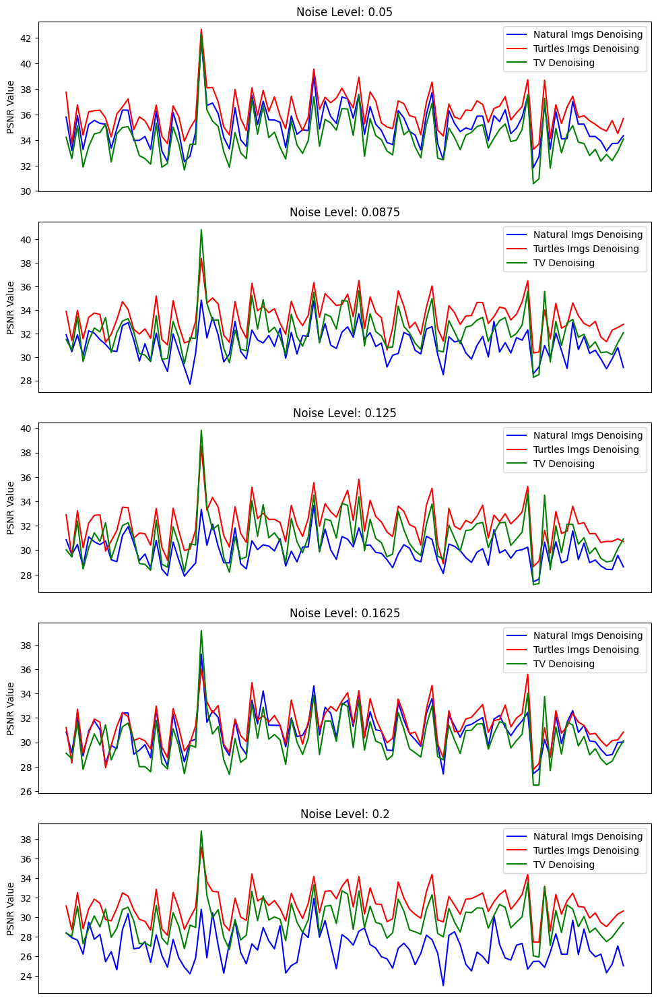

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import os

results_directory = 'denoising_results'  
tv_results_directory = 'tv_results'
noise_levels = [0.05, 0.0875, 0.125, 0.1625, 0.2]

plt.figure(figsize=(10, 15))

for idx, noise_level in enumerate(noise_levels):
    custom_denoising_df = pd.read_csv(os.path.join(results_directory, f'results_custom_denoising_{noise_level}.csv'))
    natural_imgs_df = pd.read_csv(os.path.join(results_directory, f'results_natural_imgs_{noise_level}.csv'))
    tv_denoising_df = pd.read_csv(os.path.join(tv_results_directory, f'Tv_denoising_results_noise_{noise_level}.csv'))

    merged_df_c = pd.merge(natural_imgs_df, custom_denoising_df, on=['identity', 'file_name'], suffixes=('_natural', '_custom'))
    merged_df_tv = pd.merge(merged_df_c, tv_denoising_df, on=['identity', 'file_name'], suffixes=('', '_tv'))

    
    plt.subplot(5, 1, idx + 1)

    # Plot the PSNR values
    plt.plot(merged_df_tv['file_name'], merged_df_tv['psnr_value_natural'], label='Natural Imgs Denoising', color='blue')
    plt.plot(merged_df_tv['file_name'], merged_df_tv['psnr_value_custom'], label='Turtles Imgs Denoising', color='red')
    plt.plot(merged_df_tv['file_name'], merged_df_tv['psnr_value'], label='TV Denoising', color='green')

    plt.ylabel('PSNR Value')
    plt.title(f'Noise Level: {noise_level}')
    plt.xticks([])  
    plt.legend()

plt.tight_layout()
plt.savefig('denoising_comparison.png')
plt.show()


# Displaying Sample Images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


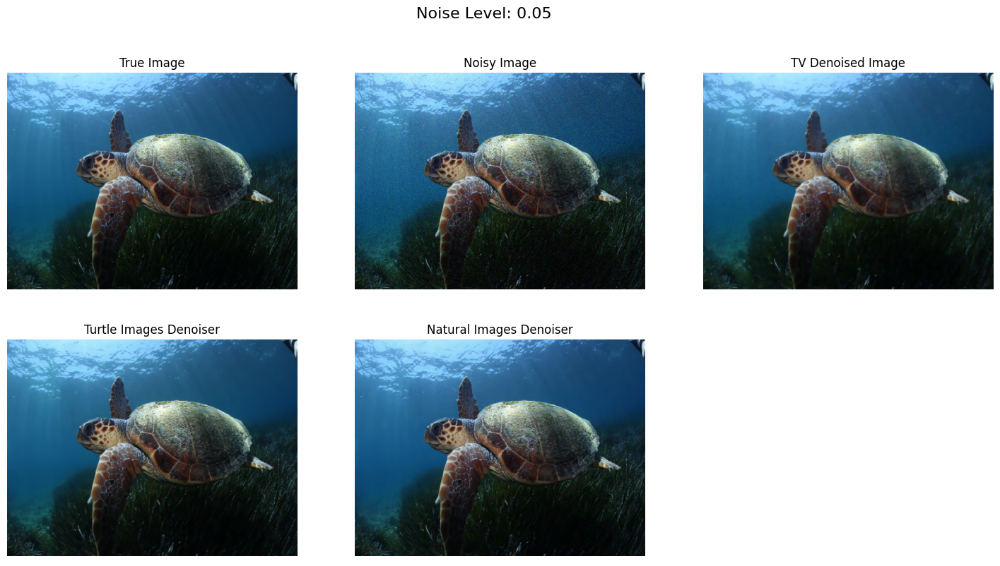

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


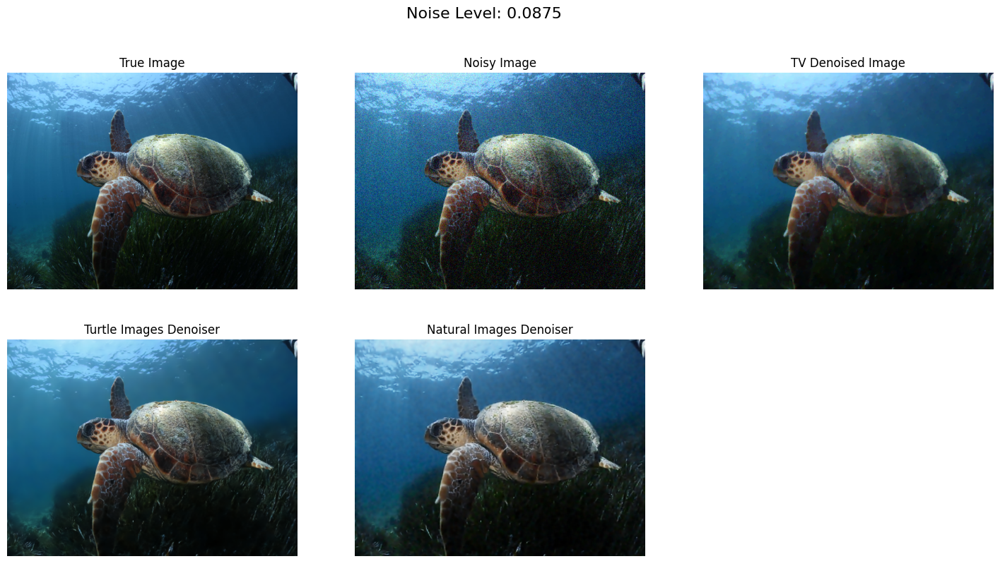

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


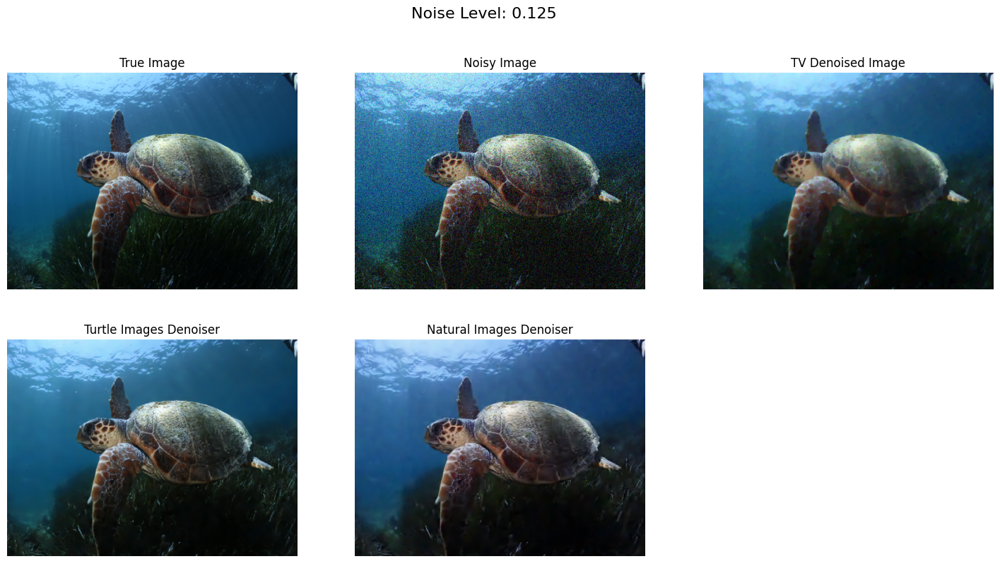

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


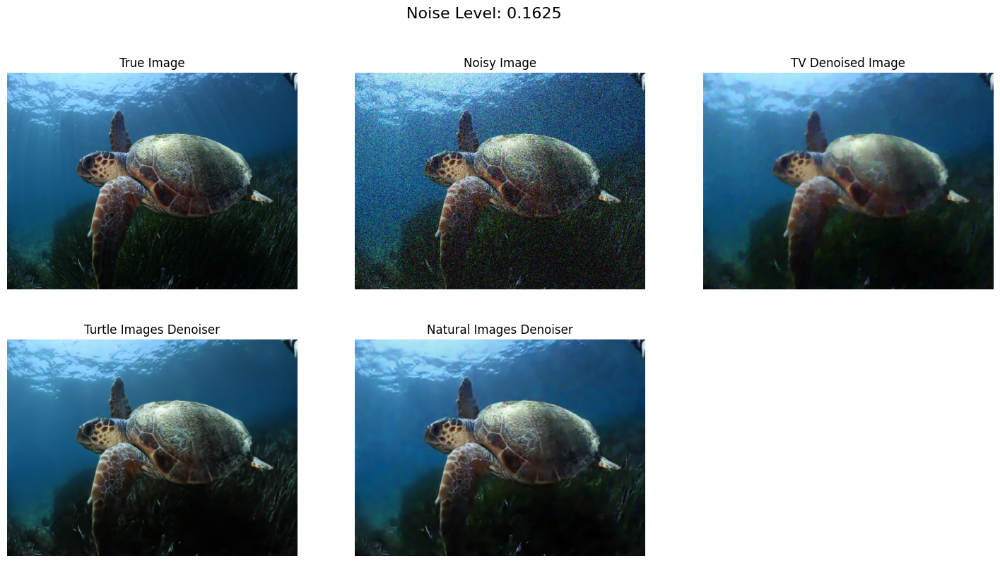

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


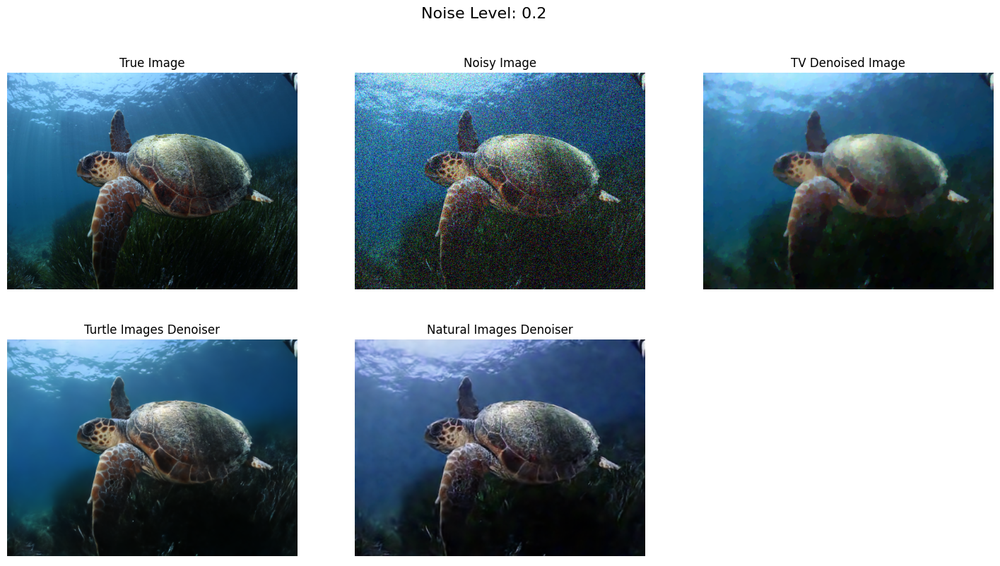

Results saved in the 'output_images_2' directory.


In [17]:
warnings.filterwarnings("ignore", category=UserWarning)

output_dir = "output_images_2"
os.makedirs(output_dir, exist_ok=True)
noise_levels = [0.05, 0.0875, 0.125, 0.1625, 0.2]

mean_ths_values = {}
for noise_level in noise_levels:
    ths_file = f'best_ths/best_ths_noise_{noise_level}.csv'
    ths_df = pd.read_csv(ths_file)
    mean_ths = ths_df['Best_ths'].mean()
    mean_ths_values[noise_level] = mean_ths

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
transform = transforms.ToTensor()

for noise_level in noise_levels:
    display_df = sampled_df[sampled_df['file_name'] == 'images/t441/twkHlyAaYh.JPG']
    
    fig, axs = plt.subplots(2, 3, figsize=(18, 9))
    
    for index, row in display_df.iterrows():
        file_name = row['file_name']
        image_path = os.path.join(file_name)
        image = Image.open(image_path).resize((1920, 1440))
        
        true_image_downsampled_without_noise, true_image_downsampled_with_noise = image_prep_denoising(image, noise_level)

        with torch.no_grad():  
            custom_denoised_image = denoisers[noise_level][0](true_image_downsampled_with_noise)
            natural_denoised_image = denoisers_natural_imgs[noise_level][0](true_image_downsampled_with_noise)
            tv_denoised_image = tv_denoising(true_image_downsampled_with_noise, ths=mean_ths_values[noise_level])

        # tensors to numpy arrays for saving
        true_image_np = true_image_downsampled_without_noise.squeeze(0).detach().cpu().numpy().transpose(1, 2, 0)
        noisy_image_np = true_image_downsampled_with_noise.squeeze(0).detach().cpu().numpy().transpose(1, 2, 0)
        custom_denoised_image_np = custom_denoised_image.squeeze(0).detach().cpu().numpy().transpose(1, 2, 0)
        natural_denoised_image_np = natural_denoised_image.squeeze(0).detach().cpu().numpy().transpose(1, 2, 0)
        tv_denoised_image_np = tv_denoised_image.squeeze(0).detach().cpu().numpy().transpose(1, 2, 0)

        # Plot images
        axs[0, 0].imshow(true_image_np)
        axs[0, 0].set_title("True Image")
        axs[0, 0].axis('off')

        axs[0, 1].imshow(noisy_image_np)
        axs[0, 1].set_title("Noisy Image")
        axs[0, 1].axis('off')

        axs[0, 2].imshow(tv_denoised_image_np)
        axs[0, 2].set_title("TV Denoised Image")
        axs[0, 2].axis('off')

        axs[1, 0].imshow(custom_denoised_image_np)
        axs[1, 0].set_title("Turtle Images Denoiser")
        axs[1, 0].axis('off')

        axs[1, 1].imshow(natural_denoised_image_np)
        axs[1, 1].set_title("Natural Images Denoiser")
        axs[1, 1].axis('off')

        axs[1, 2].axis('off') 

        plt.savefig(os.path.join(output_dir, f"results_noise_{noise_level}_index_{index}.png"))

        del true_image_downsampled_without_noise
        del true_image_downsampled_with_noise
        del custom_denoised_image
        del natural_denoised_image
        del tv_denoised_image
        torch.cuda.empty_cache()  
    
    plt.suptitle(f'Noise Level: {noise_level}', fontsize=16)
    plt.show()

print(f"Results saved in the '{output_dir}' directory.")

      